In [1]:
import pandas as pd
import datetime 
from os import listdir # os is a module for interacting with the OS
from os.path import isfile, join # to verify file object, and concatenate paths
import glob # to find pathnames matching a specific pattern
import re # regular expressions :)
from collections import Counter
import nltk # importing natural language tool
import scipy.stats as st
from matplotlib import rcParams
import matplotlib.pyplot as plt
from operator import itemgetter


In [2]:
#import data set
df = pd.read_csv("./archive.csv")
df.head()

,Year,Category,Prize,Motivation,Prize Share,Laureate ID,Laureate Type,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country
0,1901,Chemistry,The Nobel Prize in Chemistry 1901,"""in recognition of the extraordinary services ...",1/1,160,Individual,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany
1,1901,Literature,The Nobel Prize in Literature 1901,"""in special recognition of his poetic composit...",1/1,569,Individual,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France
2,1901,Medicine,The Nobel Prize in Physiology or Medicine 1901,"""for his work on serum therapy, especially its...",1/1,293,Individual,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany
3,1901,Peace,The Nobel Peace Prize 1901,NaN,1/2,462,Individual,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland
4,1901,Peace,The Nobel Peace Prize 1901,NaN,1/2,463,Individual,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France


<h1 style="color:green">Part I: Data Cleaning</h1>

<h1>Replacing Unwanted Characters in the Data Set</h1>

<body>To standarize the data in all records, a process of removing the symbols in all columns at once using <i>columns.str.replace</i> will first be tried to limit the characters to be used per column to english alphabets, but <i>columns.str.replace</i> accesses the columns' names not the data in the columns.
 
 So instead, we use <i>str.replace</i> after specifying the needed column, and that will work on the data values related to that column. 
    
However, we don't just want to remove the symbols, but replace them with the intended letters. For example, if the symbol is '@', we would like to change it to the letter 'a'. And the same will be done with other symbols.</body><br><br>

<body>Through observation, the <i>Full Name</i> attribute, was the one in need of character replacement: <body>

In [3]:
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_rows', 969) 
df["Full Name"] = df["Full Name"].str.replace("@","a")
df["Full Name"] = df["Full Name"].str.replace("$","s")
df["Full Name"] = df["Full Name"].str.replace(r"[_!#%^&*()<>?/\|}{~:]+", " ")
df['Full Name']

0      Jacobus Henricus van 't Hoff                                                            
1      Sully Prudhomme                                                                         
2      Emil Adolf von Behring                                                                  
3      Jean Henry Dunant                                                                       
4      Frédéric Passy                                                                          
5      Wilhelm Conrad Röntgen                                                                  
6      Hermann Emil Fischer                                                                    
7      Christian Matthias Theodor Mommsen                                                      
8      Ronald Ross                                                                             
9      Élie Ducommun                                                                           
10     Charles Albert Gobat             

<body> We also notice in the <i>Full Name</i> attribute, that some records, exactly four as we can see below, contain the birth city as well.<br>
So we remove the part containing the birth city, since we already have a <i>Birth City</i> attribute handling this info, as there is no need for repetition.<br> 
The word "née" means born in french.</body>


In [4]:
d1 = df[df['Full Name'].str.contains('née') == True]
print(d1["Full Name"].count())
d1

4


,Year,Category,Prize,Motivation,Prize Share,Laureate ID,Laureate Type,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country
19,1903,Physics,The Nobel Prize in Physics 1903,"""in recognition of the extraordinary services they have rendered by their joint researches on the radiation phenomena discovered by Professor Henri Becquerel""",1/4,6,Individual,"Marie Curie, née Sklodowska",1867-11-07,Warsaw,Russian Empire (Poland),Female,NaN,NaN,NaN,1934-07-04,Sallanches,France
29,1905,Peace,The Nobel Peace Prize 1905,NaN,1/1,468,Individual,"Baroness Bertha Sophie Felicita von Suttner, née Countess Kinsky von Chinic und Tettau",1843-06-09,Prague,Austrian Empire (Czech Republic),Female,NaN,NaN,NaN,1914-06-21,Vienna,Austria
63,1911,Chemistry,The Nobel Prize in Chemistry 1911,"""in recognition of her services to the advancement of chemistry by the discovery of the elements radium and polonium, by the isolation of radium and the study of the nature and compounds of this remarkable element""",1/1,6,Individual,"Marie Curie, née Sklodowska",1867-11-07,Warsaw,Russian Empire (Poland),Female,Sorbonne University,Paris,France,1934-07-04,Sallanches,France
242,1947,Medicine,The Nobel Prize in Physiology or Medicine 1947,"""for their discovery of the course of the catalytic conversion of glycogen""",1/4,344,Individual,"Gerty Theresa Cori, née Radnitz",1896-08-15,Prague,Austria-Hungary (Czech Republic),Female,Washington University,"St. Louis, MO",United States of America,1957-10-26,"St. Louis, MO",United States of America


Now we remove this extra part from the four shown previous records:

In [5]:
df["Full Name"] = df["Full Name"].str.replace(", née Sklodowska","")
df["Full Name"] = df["Full Name"].str.replace(", née Countess Kinsky von Chinic und Tettau","")
df["Full Name"] = df["Full Name"].str.replace(", née Radnitz","")
d2 = df[df['Full Name'].str.contains('née') == True]
print(d2["Full Name"].count())
d2

0


,Year,Category,Prize,Motivation,Prize Share,Laureate ID,Laureate Type,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country


In addition to standarizing the characters to English only, the removal of the double quotation marks from the <i>Motivation</i> is essential to later perform analysis 

In [6]:
df["Motivation"] = df["Motivation"].str.replace('"', '')

In [7]:
df

,Year,Category,Prize,Motivation,Prize Share,Laureate ID,Laureate Type,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country
0,1901,Chemistry,The Nobel Prize in Chemistry 1901,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Individual,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany
1,1901,Literature,The Nobel Prize in Literature 1901,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Individual,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France
2,1901,Medicine,The Nobel Prize in Physiology or Medicine 1901,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Individual,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany
3,1901,Peace,The Nobel Peace Prize 1901,NaN,1/2,462,Individual,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland
4,1901,Peace,The Nobel Peace Prize 1901,NaN,1/2,463,Individual,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France
5,1901,Physics,The Nobel Prize in Physics 1901,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Individual,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany
6,1902,Chemistry,The Nobel Prize in Chemistry 1902,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Individual,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany
7,1902,Literature,The Nobel Prize in Literature 1902,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Individual,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,NaN,NaN,NaN,1903-11-01,Charlottenburg,Germany
8,1902,Medicine,The Nobel Prize in Physiology or Medicine 1902,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Individual,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom
9,1902,Peace,The Nobel Peace Prize 1902,NaN,1/2,464,Individual,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland


<h1>Checking missing Values</h1>
<body>In the below steps, an observation of the null values in the data frame is to be made</body>

In [8]:
#display sum of missing values
df_nulls = df.isnull().sum()
df_nulls 

Year                    0  
Category                0  
Prize                   0  
Motivation              88 
Prize Share             0  
Laureate ID             0  
Laureate Type           0  
Full Name               0  
Birth Date              29 
Birth City              28 
Birth Country           26 
Sex                     26 
Organization Name       247
Organization City       253
Organization Country    253
Death Date              352
Death City              370
Death Country           364
dtype: int64

It seems like the<i> Birth City</i> is missing 28 values. Let's see which of the winners have those missing <i> Birth City</i> values

In [9]:
#copy the full name, birth city, birth date, laureate type, organization city, organization name, and sex
newdf = df[['Full Name','Birth City','Birth Date', 'Laureate Type','Organization Country','Organization City','Organization Name','Sex']].copy()
newdf
#display the rows in which the Birth City is null
d1 = newdf[(newdf['Birth City'].isnull())]
d1

,Full Name,Birth City,Birth Date,Laureate Type,Organization Country,Organization City,Organization Name,Sex
24,Institut de droit international Institute of International Law,NaN,NaN,Organization,NaN,NaN,NaN,NaN
61,Bureau international permanent de la Paix Permanent International Peace Bureau,NaN,NaN,Organization,NaN,NaN,NaN,NaN
90,Comité international de la Croix Rouge International Committee of the Red Cross,NaN,NaN,Organization,NaN,NaN,NaN,NaN
206,Office international Nansen pour les Réfugiés Nansen International Office for Refugees,NaN,NaN,Organization,NaN,NaN,NaN,NaN
222,Comité international de la Croix Rouge International Committee of the Red Cross,NaN,NaN,Organization,NaN,NaN,NaN,NaN
244,Friends Service Council The Quakers,NaN,NaN,Organization,NaN,NaN,NaN,NaN
245,American Friends Service Committee The Quakers,NaN,NaN,Organization,NaN,NaN,NaN,NaN
295,Office of the United Nations High Commissioner for Refugees UNHCR,NaN,NaN,Organization,NaN,NaN,NaN,NaN
365,Comité international de la Croix Rouge International Committee of the Red Cross,NaN,NaN,Organization,NaN,NaN,NaN,NaN
366,Ligue des Sociétés de la Croix-Rouge League of Red Cross Societies,NaN,NaN,Organization,NaN,NaN,NaN,NaN


<h1>Observation</h1>
<span>As you might have noticed most of the <i> Birth City</i> missing values are coming from <i>Laureate Type</i>: <i>Organization</i>. Not only is the <i> Birth City</i> missing, but also the <i> Birth Date</i>, <i>Sex</i>, <i> Organization Name</i>, <i> Organization City</i>, and <i> Organization Country</i>. This makes sense, as winning as an organization means that you are a group of people which might come from different univeristies (organization), birth cities, organization countries, cities, and are of differenet sexes. Besides, each of them might have a different birth date</span>
<br><br>
<span>Moreover, for the <i>Laureate Type</i>: <i>Organization</i>, the <i>Full Name</i> contains the name of the organization, not the name of the person. This is an indication that they are a group not an individual person who won the Nobel prize</span>

In [10]:
organizationCount = newdf[(newdf['Laureate Type']=="Organization")].count() 
# from the above line we can observe the number of existing birth city when the laureate type is organization

#check the number of rows with missing Birth City and laureate type of individual
countBirthIndividual = newdf[(newdf['Birth City'].isnull()) &(newdf['Laureate Type']=="Individual")].count()
display(organizationCount,countBirthIndividual)


Full Name               30
Birth City              4 
Birth Date              4 
Laureate Type           30
Organization Country    0 
Organization City       0 
Organization Name       0 
Sex                     4 
dtype: int64

Full Name               2
Birth City              0
Birth Date              2
Laureate Type           2
Organization Country    0
Organization City       0
Organization Name       0
Sex                     2
dtype: int64

<h1>Checking number of organization laureate type</h1>
<span>What we want to observe is the number of organization laureate type, and those with missing birth city, organization name, organization country, organization city, birth date, and sex</span>

In [11]:
missingOrganization = newdf[(newdf['Laureate Type']=="Organization")&(newdf['Organization Name'].isnull())&(newdf['Organization City'].isnull())&(newdf['Organization Country'].isnull())&(newdf['Birth City'].isnull())&(newdf['Sex'].isnull())&(newdf['Birth Date'].isnull())].count()
missingOrganization

Full Name               26
Birth City              0 
Birth Date              0 
Laureate Type           26
Organization Country    0 
Organization City       0 
Organization Name       0 
Sex                     0 
dtype: int64

<h1> Analyzing the above result </h1>
The number of rows of laureate type organization which contain missing organization info, sex, birth date, and birth city are 26/30 rows. Likewise, only 4 rows contained birth city even without checking on the organization info (Organization name, city, and country). Now let's check the rows which contain the birth city and are of laurete type orgainzation.

In [12]:
#checking the 4 rows which contain birth date, birth city, sex, and are of type organization
laureate_org_expection = newdf[(newdf['Laureate Type'] == 'Organization') & (newdf['Sex'].notnull()) & (newdf['Birth Date'].notnull())& (newdf['Birth City'].notnull())]
laureate_org_expection

,Full Name,Birth City,Birth Date,Laureate Type,Organization Country,Organization City,Organization Name,Sex
452,Le Duc Tho,Nam Ha province,1911-10-14,Organization,NaN,NaN,NaN,Male
520,Mother Teresa,Uskup (Skopje),1910-08-26,Organization,NaN,NaN,NaN,Female
620,The 14th Dalai Lama Tenzin Gyatso,Taktser,1935-07-06,Organization,NaN,NaN,NaN,Male
640,Aung San Suu Kyi,Rangoon (Yangon),1945-06-19,Organization,NaN,NaN,NaN,Female


<h1> Why do sexes, birth dates, and birth cities exist above? </h1>
<span>It seems like not only the birth city, birth date, and sex exist, but also, the full names are names of actual people and not a group. This might indicate that those people were part of an organization, or this data is mistakenly categorized as of laureate type <span style ="font-style:italic">Organization<span> </span>

<h1>Checking if we can drop rows of <span style ="font-style:italic">Laureate Type:</span> <span style ="font-style:italic">Organization</span> </h1>
<body>Let's check how many rows of <i>Laureate Type</i> <i>Organization</i> exist. If they are less or equal to 3% perecent of the data, we will choose to drop any column of type organization and focus our study on individuals.<br><br>
The reasons behind dropping the values are the missing data in records of <i>Laureate Type </i>: <i>Organization</i>. Besides, <i>Full Name</i> attribute for winners with a <i>Laureate Type</i> of <i>Organization</i> is an organization name (except for 4 records where the <i>Full Name</i> is the name of a person).<br><br> Therefore, due to all these inconsistencies and missing values. The observation was to be focused on <i>Laureate Type:</i>  <i>Individual</i> </body>
    

In [13]:
# How many total missing values do we have?
# shape returns the dimentionality of a dataframe (rows and columns)
# how many rows exist in the data set
dfNumofRows = df.shape[0]
# how many rows exist with type organization
laureateOrganization_df = newdf[(newdf['Laureate Type']=="Organization")]
orgNumofRows= laureateOrganization_df.shape[0]
#calculate the perecentage of organization data with respect to the whole data set
perc_drop= (orgNumofRows/dfNumofRows)*100
perc_drop

3.0959752321981426

Since the perecentage of the rows to be dropped, rows which carry laureate type <span style ="font-style:italic">Organization</span> is approximately 3, we will choose to drop those rows.

In [14]:
#drop the rows of type organization
df = df[df['Laureate Type'] != "Organization"] 

In [15]:
df

,Year,Category,Prize,Motivation,Prize Share,Laureate ID,Laureate Type,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country
0,1901,Chemistry,The Nobel Prize in Chemistry 1901,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Individual,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany
1,1901,Literature,The Nobel Prize in Literature 1901,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Individual,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France
2,1901,Medicine,The Nobel Prize in Physiology or Medicine 1901,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Individual,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany
3,1901,Peace,The Nobel Peace Prize 1901,NaN,1/2,462,Individual,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland
4,1901,Peace,The Nobel Peace Prize 1901,NaN,1/2,463,Individual,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France
5,1901,Physics,The Nobel Prize in Physics 1901,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Individual,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany
6,1902,Chemistry,The Nobel Prize in Chemistry 1902,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Individual,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany
7,1902,Literature,The Nobel Prize in Literature 1902,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Individual,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,NaN,NaN,NaN,1903-11-01,Charlottenburg,Germany
8,1902,Medicine,The Nobel Prize in Physiology or Medicine 1902,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Individual,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom
9,1902,Peace,The Nobel Peace Prize 1902,NaN,1/2,464,Individual,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland


In [16]:
# we can drop the Laureate Type column since it is the same for all rows (records).
df['Laureate Type'].nunique()

1

In [17]:
# dropping the Laureate Type column
df = df.drop(['Laureate Type'], axis=1)
df

,Year,Category,Prize,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country
0,1901,Chemistry,The Nobel Prize in Chemistry 1901,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany
1,1901,Literature,The Nobel Prize in Literature 1901,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France
2,1901,Medicine,The Nobel Prize in Physiology or Medicine 1901,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany
3,1901,Peace,The Nobel Peace Prize 1901,NaN,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland
4,1901,Peace,The Nobel Peace Prize 1901,NaN,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France
5,1901,Physics,The Nobel Prize in Physics 1901,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany
6,1902,Chemistry,The Nobel Prize in Chemistry 1902,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany
7,1902,Literature,The Nobel Prize in Literature 1902,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,NaN,NaN,NaN,1903-11-01,Charlottenburg,Germany
8,1902,Medicine,The Nobel Prize in Physiology or Medicine 1902,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom
9,1902,Peace,The Nobel Peace Prize 1902,NaN,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland


# Checking for other redundant attributes

<body>The <i>Prize</i> column holds information that's already present in two other columns (<i>Year</i> and <i>Category</i>). Therefore, since it's redundant, we decided to drop it as well.</body>

In [18]:
# dropping the Prize column
df = df.drop(['Prize'], axis=1)
df.head()

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country
0,1901,Chemistry,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany
1,1901,Literature,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France
2,1901,Medicine,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany
3,1901,Peace,NaN,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland
4,1901,Peace,NaN,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France


<h1>Check missing <span style="font-style:italic">Birth Dates</span></h1>
<body>Now that the data contains indivdual laureates only, let's check how many of them is missing the birth date, given that we have dropped the organization laureates which had missing birth dates as they were groups. The <i>Birth Date</i> is essential in order to calculate the winning age</body>

In [19]:
newdf = df.copy()
newdf[newdf["Birth Date"].isnull()]

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country
853,2009,Chemistry,for studies of the structure and function of the ribosome,1/3,841,Venkatraman Ramakrishnan,NaN,"Chidambaram, Tamil Nadu",India,Male,MRC Laboratory of Molecular Biology,Cambridge,United Kingdom,NaN,NaN,NaN
894,2011,Physics,for the discovery of the accelerating expansion of the Universe through observations of distant supernovae,1/2,864,Saul Perlmutter,NaN,"Champaign-Urbana, IL",United States of America,Male,Lawrence Berkeley National Laboratory,"Berkeley, CA",United States of America,NaN,NaN,NaN
895,2011,Physics,for the discovery of the accelerating expansion of the Universe through observations of distant supernovae,1/2,864,Saul Perlmutter,NaN,"Champaign-Urbana, IL",United States of America,Male,University of California,"Berkeley, CA",United States of America,NaN,NaN,NaN


<h1> Retrieving Alternative Datasets</h1>
<body>Since there are three missing values, a research was made to try and find another data set which might carry the birth date of those 3 winners. Hence, the data can be merged or achieved from the below dataset. This dataset was reterived from: <a>https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/AGAFAQ</a> </body>

In [20]:
df_alternative = pd.read_csv("./laureate.csv")
df_alternative.head()

,id,firstname,surname,born,died,bornCountry,bornCountryCode,bornCity,diedCountry,diedCountryCode,diedCity,gender,year,category,overallMotivation,share,motivation,name,city,country
0,1,Wilhelm Conrad,Röntgen,1845-03-27,1923-02-10,Prussia (now Germany),DE,Lennep (now Remscheid),Germany,DE,Munich,male,1901.0,physics,NaN,1.0,"""in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him""",Munich University,Munich,Germany
1,2,Hendrik Antoon,Lorentz,1853-07-18,1928-02-04,the Netherlands,NL,Arnhem,the Netherlands,NL,NaN,male,1902.0,physics,NaN,2.0,"""in recognition of the extraordinary service they rendered by their researches into the influence of magnetism upon radiation phenomena""",Leiden University,Leiden,the Netherlands
2,3,Pieter,Zeeman,1865-05-25,1943-10-09,the Netherlands,NL,Zonnemaire,the Netherlands,NL,Amsterdam,male,1902.0,physics,NaN,2.0,"""in recognition of the extraordinary service they rendered by their researches into the influence of magnetism upon radiation phenomena""",Amsterdam University,Amsterdam,the Netherlands
3,4,Antoine Henri,Becquerel,1852-12-15,1908-08-25,France,FR,Paris,France,FR,NaN,male,1903.0,physics,NaN,2.0,"""in recognition of the extraordinary services he has rendered by his discovery of spontaneous radioactivity""",École Polytechnique,Paris,France
4,5,Pierre,Curie,1859-05-15,1906-04-19,France,FR,Paris,France,FR,Paris,male,1903.0,physics,NaN,4.0,"""in recognition of the extraordinary services they have rendered by their joint researches on the radiation phenomena discovered by Professor Henri Becquerel""",École municipale de physique et de chimie industrielles (Municipal School of Industrial Physics and Chemistry),Paris,France


In [21]:
#checking the birthdates using the laureate id in the new data set
df_alternative[(df_alternative['id']==841)|(df_alternative['id']==864)]

,id,firstname,surname,born,died,bornCountry,bornCountryCode,bornCity,diedCountry,diedCountryCode,diedCity,gender,year,category,overallMotivation,share,motivation,name,city,country
862,841,Venkatraman,Ramakrishnan,0000-00-00,0000-00-00,India,IN,"Chidambaram, Tamil Nadu",NaN,NaN,NaN,male,2009.0,chemistry,NaN,3.0,"""for studies of the structure and function of the ribosome""",MRC Laboratory of Molecular Biology,Cambridge,United Kingdom
887,864,Saul,Perlmutter,0000-00-00,0000-00-00,USA,US,"Champaign-Urbana, IL",NaN,NaN,NaN,male,2011.0,physics,NaN,2.0,"""for the discovery of the accelerating expansion of the Universe through observations of distant supernovae""",Lawrence Berkeley National Laboratory,"Berkeley, CA",USA
888,864,Saul,Perlmutter,0000-00-00,0000-00-00,USA,US,"Champaign-Urbana, IL",NaN,NaN,NaN,male,2011.0,physics,NaN,2.0,"""for the discovery of the accelerating expansion of the Universe through observations of distant supernovae""",University of California,"Berkeley, CA",USA


<body> As shown above, the birth dates, <span style="font-style:italic">born</span>, and death dates, <span style="font-style:italic">died</span>, are assigned to a default zeros format. Indicating that the values are also missing. (BASMAAA) Therefore, the age will be calculated for the rest of the rows which have existing birth dates. Afterward, the age will be imputed for the 3 rows with missing birth dates values. </body>

WAIT FOR BASMA for normal age

<h1>Impute Winning Age</h1>
<body>We find out that we have three missing values of the birth date and no missing values of the winning year <span style="font-style:italic">Year</span>, So we will create a new dataset with the birth date values without the nulls and compute the age of winning the prize then we will impute the missing values after adding the age column to our orginal dataset </body>

In [22]:
#new data set called Birth_Date, where the Birth Date null records were dropped
Birth_Date = df[['Laureate ID','Year','Birth Date', 'Death Date']]
Birth_Date = Birth_Date.dropna(axis=0, subset=['Birth Date'])
#Birth_Date[Birth_Date["Death Date"].isnull()].sum()

<h1> Extract the Birth Year</h1>
Now we don't have any null values in the <span style="font-style:italic"> Birth Date</span> and the <span style="font-style:italic"> Year </span> column. 
Therefore, we only extract the year of birth from the <span style="font-style:italic">Birth Date</span> to be able to calculate the age of winning the nobel prize. Since, the<span style="font-style:italic"> Year</span> column has the winning year, rather than the date.

In [23]:
#The code below extracts the year from the date
Birth_Date["Birth Date"] = Birth_Date["Birth Date"].str.extract("(\d+)-", expand=False).astype(float)
Birth_Date.head(2)

,Laureate ID,Year,Birth Date,Death Date
0,160,1901,1852.0,1911-03-01
1,569,1901,1839.0,1907-09-07


<h1> Calculate the Winning Age</h1>
2- Calculate the winning age by subtracting the<span style="font-style:italic">Birth Date</span> column from the <span style="font-style:italic">Year</span> column. <br>
3- Create a column within the <span style="font-style:italic">Birth_Date</span> dataframe which will hold the calculated winning age

In [24]:
winning_age = Birth_Date["Year"] - Birth_Date["Birth Date"]
Birth_Date['Winning_age'] = winning_age
Birth_Date.head(5)

,Laureate ID,Year,Birth Date,Death Date,Winning_age
0,160,1901,1852.0,1911-03-01,49.0
1,569,1901,1839.0,1907-09-07,62.0
2,293,1901,1854.0,1917-03-31,47.0
3,462,1901,1828.0,1910-10-30,73.0
4,463,1901,1822.0,1912-06-12,79.0


Now we have the winning age of all our dataset records which had non null<span style="font-style:italic"> Birth Date</span> and we will add this column to our dataframe

In [25]:
df=df.copy()
df["Winning_age"] = winning_age
#check the missing winning age as a result of the birth date null values
display(df[df["Winning_age"].isnull()])

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
853,2009,Chemistry,for studies of the structure and function of the ribosome,1/3,841,Venkatraman Ramakrishnan,NaN,"Chidambaram, Tamil Nadu",India,Male,MRC Laboratory of Molecular Biology,Cambridge,United Kingdom,NaN,NaN,NaN,NaN
894,2011,Physics,for the discovery of the accelerating expansion of the Universe through observations of distant supernovae,1/2,864,Saul Perlmutter,NaN,"Champaign-Urbana, IL",United States of America,Male,Lawrence Berkeley National Laboratory,"Berkeley, CA",United States of America,NaN,NaN,NaN,NaN
895,2011,Physics,for the discovery of the accelerating expansion of the Universe through observations of distant supernovae,1/2,864,Saul Perlmutter,NaN,"Champaign-Urbana, IL",United States of America,Male,University of California,"Berkeley, CA",United States of America,NaN,NaN,NaN,NaN


<h1> Impute the Missing Winning Age </h1>
<body>Since we have three missing winning age as result of missing the <span style="font-style:italic"> Birth Date</span>, we will compute these values using the mean accorrding to the sex column.</body>

In [26]:
df=df.copy()
df["Winning_age"] = df.groupby("Sex")["Winning_age"].transform(lambda x: x.fillna(x.mean()))
#basma missing outliers

In [27]:
#waiting for basma
display(df[df["Death Date"].isnull()])

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
318,1957,Physics,for their penetrating investigation of the so-called parity laws which has led to important discoveries regarding the elementary particles,1/2,68,Chen Ning Yang,1922-09-22,"Hofei, Anhwei",China,Male,Institute for Advanced Study,"Princeton, NJ",United States of America,NaN,NaN,NaN,35.000000
319,1957,Physics,for their penetrating investigation of the so-called parity laws which has led to important discoveries regarding the elementary particles,1/2,69,Tsung-Dao T.D. Lee,1926-11-24,Shanghai,China,Male,Columbia University,"New York, NY",United States of America,NaN,NaN,NaN,31.000000
355,1962,Medicine,for their discoveries concerning the molecular structure of nucleic acids and its significance for information transfer in living material,1/3,373,James Dewey Watson,1928-04-06,"Chicago, IL",United States of America,Male,Harvard University,"Cambridge, MA",United States of America,NaN,NaN,NaN,34.000000
393,1967,Chemistry,"for their studies of extremely fast chemical reactions, effected by disturbing the equilibrium by means of very short pulses of energy",1/2,233,Manfred Eigen,1927-05-09,Bochum,Germany,Male,Max-Planck-Institut für Physikalische Chemie,Göttingen,Federal Republic of Germany,NaN,NaN,NaN,40.000000
417,1969,Physics,for his contributions and discoveries concerning the classification of elementary particles and their interactions,1/1,90,Murray Gell-Mann,1929-09-15,"New York, NY",United States of America,Male,California Institute of Technology (Caltech),"Pasadena, CA",United States of America,NaN,NaN,NaN,40.000000
437,1972,Economics,for their pioneering contributions to general economic equilibrium theory and welfare theory,1/2,682,Kenneth J. Arrow,1921-08-23,"New York, NY",United States of America,Male,Harvard University,"Cambridge, MA",United States of America,NaN,NaN,NaN,51.000000
442,1972,Physics,"for their jointly developed theory of superconductivity, usually called the BCS-theory",1/3,95,Leon Neil Cooper,1930-02-28,"New York, NY",United States of America,Male,Brown University,"Providence, RI",United States of America,NaN,NaN,NaN,42.000000
443,1972,Physics,"for their jointly developed theory of superconductivity, usually called the BCS-theory",1/3,96,John Robert Schrieffer,1931-05-31,"Oak Park, IL",United States of America,Male,University of Pennsylvania,"Philadelphia, PA",United States of America,NaN,NaN,NaN,41.000000
451,1973,Peace,NaN,1/2,530,Henry A. Kissinger,1923-05-27,Fürth,Germany,Male,NaN,NaN,NaN,NaN,NaN,NaN,50.000000
453,1973,Physics,"for their experimental discoveries regarding tunneling phenomena in semiconductors and superconductors, respectively",1/4,97,Leo Esaki,1925-03-12,Osaka,Japan,Male,IBM Thomas J. Watson Research Center,"Yorktown Heights, NY",United States of America,NaN,NaN,NaN,48.000000


<h1>Check missing <span style="font-style:italic">Birth Cities</span></h1>
<body>In the below code, the rows with missing birth city</body>

In [28]:
newdf[newdf["Birth City"].isnull()]

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country
750,2001,Literature,for having united perceptive narrative and incorruptible scrutiny in works that compel us to see the presence of suppressed histories,1/1,747,Sir Vidiadhar Surajprasad Naipaul,1932-08-17,NaN,Trinidad,Male,NaN,NaN,NaN,NaN,NaN,NaN
880,2010,Peace,for his long and non-violent struggle for fundamental human rights in China,1/1,855,Liu Xiaobo,1955-12-28,NaN,China,Male,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
#check if in the new data set we can retrieve birth city of the missing rows.
df_alternative[(df_alternative['id']==855)|(df_alternative['id']==747)]

,id,firstname,surname,born,died,bornCountry,bornCountryCode,bornCity,diedCountry,diedCountryCode,diedCity,gender,year,category,overallMotivation,share,motivation,name,city,country
756,747,Sir Vidiadhar Surajprasad,Naipaul,1932-08-17,0000-00-00,Trinidad,TT,NaN,NaN,NaN,NaN,male,2001.0,literature,NaN,1.0,"""for having united perceptive narrative and incorruptible scrutiny in works that compel us to see the presence of suppressed histories""",NaN,NaN,NaN
878,855,Liu,Xiaobo,1955-12-28,0000-00-00,China,CN,NaN,NaN,NaN,NaN,male,2010.0,peace,NaN,1.0,"""for his long and non-violent struggle for fundamental human rights in China""",NaN,NaN,NaN


Since the new dataset does not contain the birth city,  <span style="font-style:italic"> bornCity </span>, for the two missing birth cities in the original dataset, no merge could be applied. Hence, the <span style="font-style:italic"> Birth City </span> mode will be used. Such that it is the mode of the city corresponding to the <span style="font-style:italic"> Birth Country </span>of the winner.

In [30]:
display(df[df["Birth Country"]=="China"])

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
313,1956,Physics,for their researches on semiconductors and their discovery of the transistor effect,1/3,67,Walter Houser Brattain,1902-02-10,Amoy,China,Male,Bell Telephone Laboratories,"Murray Hill, NJ",United States of America,1987-10-13,"Seattle, WA",United States of America,54.0
318,1957,Physics,for their penetrating investigation of the so-called parity laws which has led to important discoveries regarding the elementary particles,1/2,68,Chen Ning Yang,1922-09-22,"Hofei, Anhwei",China,Male,Institute for Advanced Study,"Princeton, NJ",United States of America,NaN,NaN,NaN,35.0
319,1957,Physics,for their penetrating investigation of the so-called parity laws which has led to important discoveries regarding the elementary particles,1/2,69,Tsung-Dao T.D. Lee,1926-11-24,Shanghai,China,Male,Columbia University,"New York, NY",United States of America,NaN,NaN,NaN,31.0
645,1992,Medicine,for their discoveries concerning reversible protein phosphorylation as a biological regulatory mechanism,1/2,446,Edmond H. Fischer,1920-04-06,Shanghai,China,Male,University of Washington,"Seattle, WA",United States of America,NaN,NaN,NaN,72.0
722,1998,Physics,for their discovery of a new form of quantum fluid with fractionally charged excitations,1/3,157,Daniel C. Tsui,1939-02-28,Henan,China,Male,Princeton University,"Princeton, NJ",United States of America,NaN,NaN,NaN,59.0
736,2000,Literature,"for an æuvre of universal validity, bitter insights and linguistic ingenuity, which has opened new paths for the Chinese novel and drama",1/1,734,Gao Xingjian,1940-01-04,Ganzhou,China,Male,NaN,NaN,NaN,NaN,NaN,NaN,60.0
867,2009,Physics,for groundbreaking achievements concerning the transmission of light in fibers for optical communication,1/2,838,Charles Kuen Kao,1933-11-04,Shanghai,China,Male,Standard Telecommunication Laboratories,Harlow,United Kingdom,NaN,NaN,NaN,76.0
868,2009,Physics,for groundbreaking achievements concerning the transmission of light in fibers for optical communication,1/2,838,Charles Kuen Kao,1933-11-04,Shanghai,China,Male,Chinese University of Hong Kong,Hong Kong,China,NaN,NaN,NaN,76.0
872,2010,Chemistry,for palladium-catalyzed cross couplings in organic synthesis,1/3,852,Ei-ichi Negishi,1935-07-14,Changchun,China,Male,Purdue University,"West Lafayette, IN",United States of America,NaN,NaN,NaN,75.0
880,2010,Peace,for his long and non-violent struggle for fundamental human rights in China,1/1,855,Liu Xiaobo,1955-12-28,NaN,China,Male,NaN,NaN,NaN,NaN,NaN,NaN,55.0


In [31]:
display(df[df["Birth Country"]=="Trinidad"])

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
750,2001,Literature,for having united perceptive narrative and incorruptible scrutiny in works that compel us to see the presence of suppressed histories,1/1,747,Sir Vidiadhar Surajprasad Naipaul,1932-08-17,NaN,Trinidad,Male,NaN,NaN,NaN,NaN,NaN,NaN,69.0


Since only one record has the <i>Birth Country: Trinidad</i>, a manual insertion of the <i>Birth City</i> of that record will be done

In [32]:
df = df.copy()  # Ensuring a copy is made
df.loc[df['Birth Country'] == "Trinidad", 'Birth City'] = 'Chaguanas Borough Corporation'

In [33]:
 #df.groupby('Birth Country')['Birth City'].transform(lambda x: x.fillna(x.mode()))
df[(df["Birth Country"]=="China")|(df["Birth Country"]=="Trinidad")] 
df["Birth City"]=df.groupby('Birth Country')['Birth City'].transform(lambda x: x.fillna(x.mode()[0]))

 #df.groupby("Birth Country")["Birth City"]

In [34]:
display(df[df["Birth Country"]=="China"])

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
313,1956,Physics,for their researches on semiconductors and their discovery of the transistor effect,1/3,67,Walter Houser Brattain,1902-02-10,Amoy,China,Male,Bell Telephone Laboratories,"Murray Hill, NJ",United States of America,1987-10-13,"Seattle, WA",United States of America,54.0
318,1957,Physics,for their penetrating investigation of the so-called parity laws which has led to important discoveries regarding the elementary particles,1/2,68,Chen Ning Yang,1922-09-22,"Hofei, Anhwei",China,Male,Institute for Advanced Study,"Princeton, NJ",United States of America,NaN,NaN,NaN,35.0
319,1957,Physics,for their penetrating investigation of the so-called parity laws which has led to important discoveries regarding the elementary particles,1/2,69,Tsung-Dao T.D. Lee,1926-11-24,Shanghai,China,Male,Columbia University,"New York, NY",United States of America,NaN,NaN,NaN,31.0
645,1992,Medicine,for their discoveries concerning reversible protein phosphorylation as a biological regulatory mechanism,1/2,446,Edmond H. Fischer,1920-04-06,Shanghai,China,Male,University of Washington,"Seattle, WA",United States of America,NaN,NaN,NaN,72.0
722,1998,Physics,for their discovery of a new form of quantum fluid with fractionally charged excitations,1/3,157,Daniel C. Tsui,1939-02-28,Henan,China,Male,Princeton University,"Princeton, NJ",United States of America,NaN,NaN,NaN,59.0
736,2000,Literature,"for an æuvre of universal validity, bitter insights and linguistic ingenuity, which has opened new paths for the Chinese novel and drama",1/1,734,Gao Xingjian,1940-01-04,Ganzhou,China,Male,NaN,NaN,NaN,NaN,NaN,NaN,60.0
867,2009,Physics,for groundbreaking achievements concerning the transmission of light in fibers for optical communication,1/2,838,Charles Kuen Kao,1933-11-04,Shanghai,China,Male,Standard Telecommunication Laboratories,Harlow,United Kingdom,NaN,NaN,NaN,76.0
868,2009,Physics,for groundbreaking achievements concerning the transmission of light in fibers for optical communication,1/2,838,Charles Kuen Kao,1933-11-04,Shanghai,China,Male,Chinese University of Hong Kong,Hong Kong,China,NaN,NaN,NaN,76.0
872,2010,Chemistry,for palladium-catalyzed cross couplings in organic synthesis,1/3,852,Ei-ichi Negishi,1935-07-14,Changchun,China,Male,Purdue University,"West Lafayette, IN",United States of America,NaN,NaN,NaN,75.0
880,2010,Peace,for his long and non-violent struggle for fundamental human rights in China,1/1,855,Liu Xiaobo,1955-12-28,Shanghai,China,Male,NaN,NaN,NaN,NaN,NaN,NaN,55.0


<h1>Imputing the missing values of the <i>Motivation</i> attribute</h1><br>
<body>There now exists 69 missing values in the <i>Motivation</i> column.<br><br> Therefore, we will try to find another dataset which contains those values. If that is the case, a merge between the two datasets is to be performed.</body>

In [35]:
df_motivation_nulls = df['Motivation'].isnull().sum()
df_motivation_nulls

69

<body>A dataset was found containing a <i>Motivation</i> attribute which could be used to fill in the missing values in the original dataset.</body>

In [36]:
# Reading the data from the dataset found, named 'nobel'
nobel_data = pd.read_csv("nobel.csv")
nobel_data.isnull().sum()

Year              0 
Category          0 
Name              0 
Birthdate         0 
Birth Place       5 
County            0 
Residence         4 
Role/Affiliate    24
Field/Language    0 
Prize Name        0 
Motivation        0 
dtype: int64

<body>No missing values for <i>Motivation</i> in the <i>nobel_data</i> dataset, so can be used to impute missing values of <i>Motivation</i> in our original dataset, to be able to use this attribute in our analysis.</body>

In [37]:
nullMotivation = df[df['Motivation'].isnull()]
nullMotivation

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
3,1901,Peace,NaN,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland,73.0
4,1901,Peace,NaN,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France,79.0
9,1902,Peace,NaN,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.0
10,1902,Peace,NaN,1/2,465,Charles Albert Gobat,1843-05-21,Tramelan,Switzerland,Male,NaN,NaN,NaN,1914-03-16,Bern,Switzerland,59.0
16,1903,Peace,NaN,1/1,466,William Randal Cremer,1828-03-18,Fareham,United Kingdom,Male,NaN,NaN,NaN,1908-07-22,London,United Kingdom,75.0
29,1905,Peace,NaN,1/1,468,Baroness Bertha Sophie Felicita von Suttner,1843-06-09,Prague,Austrian Empire (Czech Republic),Female,NaN,NaN,NaN,1914-06-21,Vienna,Austria,62.0
35,1906,Peace,NaN,1/1,470,Theodore Roosevelt,1858-10-27,"New York, NY",United States of America,Male,NaN,NaN,NaN,1919-01-06,"Oyster Bay, NY",United States of America,48.0
40,1907,Peace,NaN,1/2,471,Ernesto Teodoro Moneta,1833-09-20,Milan,Austrian Empire (Italy),Male,NaN,NaN,NaN,1918-02-10,Milan,Italy,74.0
41,1907,Peace,NaN,1/2,472,Louis Renault,1843-05-21,Autun,France,Male,Sorbonne University,Paris,France,1918-02-08,Barbizon,France,64.0
48,1908,Peace,NaN,1/2,473,Klas Pontus Arnoldson,1844-10-27,Gothenburg,Sweden,Male,NaN,NaN,NaN,1916-02-20,Stockholm,Sweden,64.0


In [38]:
# Filling the missing values for 'Motivation' by merging the dataset containing records with a null Motivation value 
# (nullMotivation), with the external dataset (nobel_data), using the winner's name for the merge

merged_df = pd.merge(nullMotivation, nobel_data, left_on="Full Name", right_on="Name", how='left').drop(['Year_y', 
'Category_y', 'Motivation_x', 'Name', 'Birthdate', 'Birth Place', 'County', 'Residence', 'Role/Affiliate', 'Field/Language', 
'Prize Name'], axis=1)

merged_df.rename(columns = {'Year_x':'Year', 'Category_x':'Category', 'Motivation_y':'Motivation'}, inplace = True)

merged_df

,Year,Category,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age,Motivation
0,1901,Peace,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland,73.0,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy
1,1901,Peace,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France,79.0,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy
2,1902,Peace,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.0,NaN
3,1902,Peace,1/2,465,Charles Albert Gobat,1843-05-21,Tramelan,Switzerland,Male,NaN,NaN,NaN,1914-03-16,Bern,Switzerland,59.0,The Nobel Peace Prize 1902 was awarded jointly to élie Ducommun and Charles Albert Gobat
4,1903,Peace,1/1,466,William Randal Cremer,1828-03-18,Fareham,United Kingdom,Male,NaN,NaN,NaN,1908-07-22,London,United Kingdom,75.0,The Nobel Peace Prize 1903 was awarded to Randal Cremer.
5,1905,Peace,1/1,468,Baroness Bertha Sophie Felicita von Suttner,1843-06-09,Prague,Austrian Empire (Czech Republic),Female,NaN,NaN,NaN,1914-06-21,Vienna,Austria,62.0,NaN
6,1906,Peace,1/1,470,Theodore Roosevelt,1858-10-27,"New York, NY",United States of America,Male,NaN,NaN,NaN,1919-01-06,"Oyster Bay, NY",United States of America,48.0,The Nobel Peace Prize 1906 was awarded to Theodore Roosevelt.
7,1907,Peace,1/2,471,Ernesto Teodoro Moneta,1833-09-20,Milan,Austrian Empire (Italy),Male,NaN,NaN,NaN,1918-02-10,Milan,Italy,74.0,The Nobel Peace Prize 1907 was awarded jointly to Ernesto Teodoro Moneta and Louis Renault
8,1907,Peace,1/2,472,Louis Renault,1843-05-21,Autun,France,Male,Sorbonne University,Paris,France,1918-02-08,Barbizon,France,64.0,The Nobel Peace Prize 1907 was awarded jointly to Ernesto Teodoro Moneta and Louis Renault
9,1908,Peace,1/2,473,Klas Pontus Arnoldson,1844-10-27,Gothenburg,Sweden,Male,NaN,NaN,NaN,1916-02-20,Stockholm,Sweden,64.0,The Nobel Peace Prize 1908 was awarded jointly to Klas Pontus Arnoldson and Fredrik Bajer


In [39]:
# Dropping the unneeded columns for a second merge with the original dataset

merged_df = merged_df.drop(['Year', 'Category', 'Prize Share', 'Laureate ID', 'Birth Date', 'Birth City', 'Birth Country', 
                            'Sex', 'Organization Name', 'Organization City', 'Organization Country', 'Death Date', 
                            'Death City', 'Death Country', 'Winning_age'], axis=1)

merged_df

,Full Name,Motivation
0,Jean Henry Dunant,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy
1,Frédéric Passy,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy
2,Élie Ducommun,NaN
3,Charles Albert Gobat,The Nobel Peace Prize 1902 was awarded jointly to élie Ducommun and Charles Albert Gobat
4,William Randal Cremer,The Nobel Peace Prize 1903 was awarded to Randal Cremer.
5,Baroness Bertha Sophie Felicita von Suttner,NaN
6,Theodore Roosevelt,The Nobel Peace Prize 1906 was awarded to Theodore Roosevelt.
7,Ernesto Teodoro Moneta,The Nobel Peace Prize 1907 was awarded jointly to Ernesto Teodoro Moneta and Louis Renault
8,Louis Renault,The Nobel Peace Prize 1907 was awarded jointly to Ernesto Teodoro Moneta and Louis Renault
9,Klas Pontus Arnoldson,The Nobel Peace Prize 1908 was awarded jointly to Klas Pontus Arnoldson and Fredrik Bajer


In [40]:
# Merging the dataset containing the filled Motivation values from the external dataset (merged_df) with our original dataset
df = pd.merge(df, merged_df, on="Full Name", how='left')
df

,Year,Category,Motivation_x,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age,Motivation_y
0,1901,Chemistry,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany,49.000000,NaN
1,1901,Literature,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France,62.000000,NaN
2,1901,Medicine,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany,47.000000,NaN
3,1901,Peace,NaN,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland,73.000000,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy
4,1901,Peace,NaN,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France,79.000000,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy
5,1901,Physics,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany,56.000000,NaN
6,1902,Chemistry,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany,50.000000,NaN
7,1902,Literature,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,NaN,NaN,NaN,1903-11-01,Charlottenburg,Germany,85.000000,NaN
8,1902,Medicine,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom,45.000000,NaN
9,1902,Peace,NaN,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.000000,NaN


In [41]:
df['Motivation_x'] = df['Motivation_x'].fillna(df['Motivation_y'])
df

,Year,Category,Motivation_x,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age,Motivation_y
0,1901,Chemistry,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany,49.000000,NaN
1,1901,Literature,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France,62.000000,NaN
2,1901,Medicine,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany,47.000000,NaN
3,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland,73.000000,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy
4,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France,79.000000,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy
5,1901,Physics,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany,56.000000,NaN
6,1902,Chemistry,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany,50.000000,NaN
7,1902,Literature,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,NaN,NaN,NaN,1903-11-01,Charlottenburg,Germany,85.000000,NaN
8,1902,Medicine,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom,45.000000,NaN
9,1902,Peace,NaN,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.000000,NaN


In [42]:
df = df.drop(['Motivation_y'], axis=1)
df.rename(columns = {'Motivation_x':'Motivation'}, inplace = True)
df

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
0,1901,Chemistry,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany,49.000000
1,1901,Literature,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France,62.000000
2,1901,Medicine,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany,47.000000
3,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland,73.000000
4,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France,79.000000
5,1901,Physics,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany,56.000000
6,1902,Chemistry,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany,50.000000
7,1902,Literature,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,NaN,NaN,NaN,1903-11-01,Charlottenburg,Germany,85.000000
8,1902,Medicine,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom,45.000000
9,1902,Peace,NaN,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.000000


In [43]:
# Checking for missing values after performing the merge
df[df['Motivation'].isnull()].shape[0]

7

There are 21 missing values for <i>Motivation</i> after merging, meaning that records for these winners were not found in the external dataset used.<br><br>

To fill these missing values, a value of <i>'Not Specified'</i> could be used, since no values for the <i>Motivation</i> were found for these records.

In [44]:
df['Motivation'] = df['Motivation'].fillna('Not Specified')
df[df['Motivation'].isnull()].shape[0]

0

<body>There are no longer missing values in the <i>'Motivation'</i> column.</body>

<h1> Imputing the missing values of the <i>Organization Name</i> attribute </h1>

Even though we removed records where the <i>Laureate Type</i> is <i>Organization</i>, <i>Individuals</i> are still considered to have an Organization/Institute/University to which they belong, which is represented by the <i>Organization Name</i> column. However, we have missing values in that column.

In [45]:
df_nulls = df.isnull().sum()
df_nulls 

# There are 217 records with missing Organization Name

Year                    0  
Category                0  
Motivation              0  
Prize Share             0  
Laureate ID             0  
Full Name               0  
Birth Date              3  
Birth City              0  
Birth Country           0  
Sex                     0  
Organization Name       217
Organization City       223
Organization Country    223
Death Date              324
Death City              342
Death Country           336
Winning_age             0  
dtype: int64

<body>The previous dataset, named <i>nobel_data</i> was found to also contain a <i>Role/Affiliate</i> attribute which can be used to fill in the missing values in our original dataset.</body>

In [46]:
nullOrganization = df[df['Organization Name'].isnull()]

In [47]:
# Filling the missing values for 'Organization Name' by merging the dataset containing records with a null Organization Name 
# value (nullOrganization), with the external dataset (nobel_data), using the winner's name for the merge

merged_df = pd.merge(nullOrganization, nobel_data, left_on="Full Name", right_on="Name", how='left').drop(['Year_y', 
'Category_y', 'Motivation_y', 'Name', 'Birthdate', 'Birth Place', 'County', 'Residence', 'Field/Language', 'Prize Name'], 
axis=1)

merged_df.rename(columns = {'Year_x':'Year', 'Category_x':'Category', 'Motivation_x':'Motivation'}, inplace = True)

merged_df

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age,Role/Affiliate
0,1901,Literature,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France,62.0,No Data
1,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland,73.0,"Originator Geneva Convention (Convention de Genève), Founder of the International Committee of the Red Cross, Geneva"
2,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France,79.0,Founder and President of first French peace society (since 1889 called Société française pour l'arbitrage entre nations)
3,1902,Literature,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,NaN,NaN,NaN,1903-11-01,Charlottenburg,Germany,85.0,No Data
4,1902,Peace,Not Specified,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.0,NaN
5,1902,Peace,The Nobel Peace Prize 1902 was awarded jointly to élie Ducommun and Charles Albert Gobat,1/2,465,Charles Albert Gobat,1843-05-21,Tramelan,Switzerland,Male,NaN,NaN,NaN,1914-03-16,Bern,Switzerland,59.0,"Honorary Secretary, Permanent International Peace Bureau, Bern, Switzerland, Secretary General, Inter-Parliamentary Union"
6,1903,Literature,"as a tribute to his noble, magnificent and versatile poetry, which has always been distinguished by both the freshness of its inspiration and the rare purity of its spirit",1/1,572,Bjørnstjerne Martinus Bjørnson,1832-12-08,Kvikne,Norway,Male,NaN,NaN,NaN,1910-04-26,Paris,France,71.0,No Data
7,1903,Peace,The Nobel Peace Prize 1903 was awarded to Randal Cremer.,1/1,466,William Randal Cremer,1828-03-18,Fareham,United Kingdom,Male,NaN,NaN,NaN,1908-07-22,London,United Kingdom,75.0,"Secretary, International Arbitration League, Member, British Parliament"
8,1903,Physics,in recognition of the extraordinary services they have rendered by their joint researches on the radiation phenomena discovered by Professor Henri Becquerel,1/4,6,Marie Curie,1867-11-07,Warsaw,Russian Empire (Poland),Female,NaN,NaN,NaN,1934-07-04,Sallanches,France,36.0,NaN
9,1904,Literature,"in recognition of the fresh originality and true inspiration of his poetic production, which faithfully reflects the natural scenery and native spirit of his people, and, in addition, his significant work as a Proven&ccedil;al philologist",1/2,573,Frédéric Mistral,1830-09-08,Maillane,France,Male,NaN,NaN,NaN,1914-03-25,Maillane,France,74.0,No Data


In [48]:
# Dropping the unneeded columns for a second merge with the original dataset

merged_df = merged_df.drop(['Year', 'Category', 'Motivation', 'Prize Share', 'Laureate ID', 'Birth Date', 'Birth City', 
                            'Birth Country', 'Sex', 'Organization Name', 'Organization City', 'Organization Country', 
                            'Death Date', 'Death City', 'Death Country', 'Winning_age'], axis=1)

merged_df

,Full Name,Role/Affiliate
0,Sully Prudhomme,No Data
1,Jean Henry Dunant,"Originator Geneva Convention (Convention de Genève), Founder of the International Committee of the Red Cross, Geneva"
2,Frédéric Passy,Founder and President of first French peace society (since 1889 called Société française pour l'arbitrage entre nations)
3,Christian Matthias Theodor Mommsen,No Data
4,Élie Ducommun,NaN
5,Charles Albert Gobat,"Honorary Secretary, Permanent International Peace Bureau, Bern, Switzerland, Secretary General, Inter-Parliamentary Union"
6,Bjørnstjerne Martinus Bjørnson,No Data
7,William Randal Cremer,"Secretary, International Arbitration League, Member, British Parliament"
8,Marie Curie,NaN
9,Frédéric Mistral,No Data


In [49]:
# Merging the dataset containing the filled Organization Name values from the external dataset (merged_df) with our original 
# dataset
df = pd.merge(df, merged_df, on="Full Name", how='left')
df

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age,Role/Affiliate
0,1901,Chemistry,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany,49.000000,NaN
1,1901,Literature,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,NaN,NaN,NaN,1907-09-07,Châtenay,France,62.000000,No Data
2,1901,Medicine,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany,47.000000,NaN
3,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,NaN,NaN,NaN,1910-10-30,Heiden,Switzerland,73.000000,"Originator Geneva Convention (Convention de Genève), Founder of the International Committee of the Red Cross, Geneva"
4,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,NaN,NaN,NaN,1912-06-12,Paris,France,79.000000,Founder and President of first French peace society (since 1889 called Société française pour l'arbitrage entre nations)
5,1901,Physics,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany,56.000000,NaN
6,1902,Chemistry,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany,50.000000,NaN
7,1902,Literature,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,NaN,NaN,NaN,1903-11-01,Charlottenburg,Germany,85.000000,No Data
8,1902,Medicine,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom,45.000000,NaN
9,1902,Peace,Not Specified,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.000000,NaN


In [50]:
df['Organization Name'] = df['Organization Name'].fillna(df['Role/Affiliate'])
df

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age,Role/Affiliate
0,1901,Chemistry,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany,49.000000,NaN
1,1901,Literature,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,No Data,NaN,NaN,1907-09-07,Châtenay,France,62.000000,No Data
2,1901,Medicine,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany,47.000000,NaN
3,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,"Originator Geneva Convention (Convention de Genève), Founder of the International Committee of the Red Cross, Geneva",NaN,NaN,1910-10-30,Heiden,Switzerland,73.000000,"Originator Geneva Convention (Convention de Genève), Founder of the International Committee of the Red Cross, Geneva"
4,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,Founder and President of first French peace society (since 1889 called Société française pour l'arbitrage entre nations),NaN,NaN,1912-06-12,Paris,France,79.000000,Founder and President of first French peace society (since 1889 called Société française pour l'arbitrage entre nations)
5,1901,Physics,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany,56.000000,NaN
6,1902,Chemistry,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany,50.000000,NaN
7,1902,Literature,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,No Data,NaN,NaN,1903-11-01,Charlottenburg,Germany,85.000000,No Data
8,1902,Medicine,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom,45.000000,NaN
9,1902,Peace,Not Specified,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.000000,NaN


In [51]:
# Dropping the Role/Affiliate column as it is no longer needed
df = df.drop(['Role/Affiliate'], axis=1)
df

,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
0,1901,Chemistry,in recognition of the extraordinary services he has rendered by the discovery of the laws of chemical dynamics and osmotic pressure in solutions,1/1,160,Jacobus Henricus van 't Hoff,1852-08-30,Rotterdam,Netherlands,Male,Berlin University,Berlin,Germany,1911-03-01,Berlin,Germany,49.000000
1,1901,Literature,"in special recognition of his poetic composition, which gives evidence of lofty idealism, artistic perfection and a rare combination of the qualities of both heart and intellect",1/1,569,Sully Prudhomme,1839-03-16,Paris,France,Male,No Data,NaN,NaN,1907-09-07,Châtenay,France,62.000000
2,1901,Medicine,"for his work on serum therapy, especially its application against diphtheria, by which he has opened a new road in the domain of medical science and thereby placed in the hands of the physician a victorious weapon against illness and deaths",1/1,293,Emil Adolf von Behring,1854-03-15,Hansdorf (Lawice),Prussia (Poland),Male,Marburg University,Marburg,Germany,1917-03-31,Marburg,Germany,47.000000
3,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,462,Jean Henry Dunant,1828-05-08,Geneva,Switzerland,Male,"Originator Geneva Convention (Convention de Genève), Founder of the International Committee of the Red Cross, Geneva",NaN,NaN,1910-10-30,Heiden,Switzerland,73.000000
4,1901,Peace,The Nobel Peace Prize 1901 was awarded jointly to Jean Henry Dunant and Frédéric Passy,1/2,463,Frédéric Passy,1822-05-20,Paris,France,Male,Founder and President of first French peace society (since 1889 called Société française pour l'arbitrage entre nations),NaN,NaN,1912-06-12,Paris,France,79.000000
5,1901,Physics,in recognition of the extraordinary services he has rendered by the discovery of the remarkable rays subsequently named after him,1/1,1,Wilhelm Conrad Röntgen,1845-03-27,Lennep (Remscheid),Prussia (Germany),Male,Munich University,Munich,Germany,1923-02-10,Munich,Germany,56.000000
6,1902,Chemistry,in recognition of the extraordinary services he has rendered by his work on sugar and purine syntheses,1/1,161,Hermann Emil Fischer,1852-10-09,Euskirchen,Prussia (Germany),Male,Berlin University,Berlin,Germany,1919-07-15,Berlin,Germany,50.000000
7,1902,Literature,"the greatest living master of the art of historical writing, with special reference to his monumental work, <I>A history of Rome</I>",1/1,571,Christian Matthias Theodor Mommsen,1817-11-30,Garding,Schleswig (Germany),Male,No Data,NaN,NaN,1903-11-01,Charlottenburg,Germany,85.000000
8,1902,Medicine,"for his work on malaria, by which he has shown how it enters the organism and thereby has laid the foundation for successful research on this disease and methods of combating it",1/1,294,Ronald Ross,1857-05-13,Almora,India,Male,University College,Liverpool,United Kingdom,1932-09-16,Putney Heath,United Kingdom,45.000000
9,1902,Peace,Not Specified,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,NaN,NaN,NaN,1906-12-07,Bern,Switzerland,69.000000


In [52]:
# Checking for missing values after performing the merge
df_orgName_nulls = df[df['Organization Name'].isnull()].shape[0]
print(df_orgName_nulls)

31


It was also noticed that for some records, after merging, the <i>Organization Name</i> is not null yet contains the value <i>'No Data'</i>, which still needs to be replaced.

In [53]:
df_noData = df[df['Organization Name'] == 'No Data'].shape[0]
print(df_noData)

114


So, there are now a total of 162 missing values in <i>Organization Name</i> after we performed the merge (73 are null ( meaning they were not found in <i>nobel_dataset</i>), and 89 are stored in the <i>nobel_dataset</i> as <i>'No Data'</i>).<br><br>

We will therefore fill these remaining missing values with the value <i>'Self'</i>, which will be used to denote that this winner does not belong to an organization, since no value for the <i>Organization Name</i> for that winner was found.

In [54]:
# Filling the null values first
df['Organization Name'] = df['Organization Name'].fillna('Self')

# There are no null values
df_orgName_nulls = df[df['Organization Name'].isnull()].shape[0]
print(df_orgName_nulls)

0


In [55]:
# Replacing the 'No Data' values with 'Self'
df.loc[df['Organization Name'] == 'No Data', ['Organization Name']] = 'Self'

# There are no 'No Data' values
df_noData = df[df['Organization Name'] == 'No Data'].shape[0]
print(df_noData)

0


In [56]:
df[df["Motivation"]=="Not Specified"]


,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age
9,1902,Peace,Not Specified,1/2,464,Élie Ducommun,1833-02-19,Geneva,Switzerland,Male,Self,NaN,NaN,1906-12-07,Bern,Switzerland,69.0
28,1905,Peace,Not Specified,1/1,468,Baroness Bertha Sophie Felicita von Suttner,1843-06-09,Prague,Austrian Empire (Czech Republic),Female,Self,NaN,NaN,1914-06-21,Vienna,Austria,62.0
54,1909,Peace,Not Specified,1/2,476,"Paul Henri Benjamin Balluet d'Estournelles de Constant, Baron de Constant de Rebecque",1852-11-22,La Flèche,France,Male,Self,NaN,NaN,1924-05-15,Paris,France,57.0
152,1930,Peace,Not Specified,1/1,495,Lars Olof Jonathan Nathan Söderblom,1866-01-15,Trönö,Sweden,Male,Self,NaN,NaN,1931-07-12,Uppsala,Sweden,64.0
169,1933,Peace,Not Specified,1/1,498,Sir Norman Angell Ralph Lane,1872-12-26,Holbeach,United Kingdom,Male,Self,NaN,NaN,1967-10-07,Croydon,United Kingdom,61.0
196,1937,Peace,Not Specified,1/1,502,"Cecil of Chelwood, Viscount Lord Edgar Algernon Robert Gascoyne Cecil",1864-09-14,London,United Kingdom,Male,Self,NaN,NaN,1958-11-24,Tunbridge Wells,United Kingdom,73.0
249,1949,Peace,Not Specified,1/1,510,Lord John Boyd Orr of Brechin,1880-09-23,Kilmaurs,Scotland,Male,Self,NaN,NaN,1971-06-25,Edzell,Scotland,69.0


<h1>Handling Duplicates</h1>
We can now check for duplicate rows and drop them.

In [57]:
duplicateRowsDF = df[df.duplicated()] 
duplicateRowsDF 
print("The duplicated rows are of the following :", duplicateRowsDF['Full Name'], sep='\n')
df =df.drop_duplicates( subset=None, keep='first', inplace=False) #drop the duplicate values

The duplicated rows are of the following :
283    Linus Carl Pauling
Name: Full Name, dtype: object


In [58]:
duplicateRowsDF = df[df.duplicated()] 
print("The duplicated rows are of the following :", duplicateRowsDF['Full Name'], sep='\n')
duplicateRowsDF 

The duplicated rows are of the following :
Series([], Name: Full Name, dtype: object)


,Year,Category,Motivation,Prize Share,Laureate ID,Full Name,Birth Date,Birth City,Birth Country,Sex,Organization Name,Organization City,Organization Country,Death Date,Death City,Death Country,Winning_age


<h1 style="color:green">Part II: Data Exploration and Visualization</h1>

Let's first analyze the gender which wins more Nobel Prizez, and its percentage compared to the whole data set.

In [59]:
 df.groupby('Sex', as_index=False)['Sex'].agg({'Gender Count':'count'})

,Sex,Gender Count
0,Female,48
1,Male,892


As you might notice there is a notable difference between female and male winners.

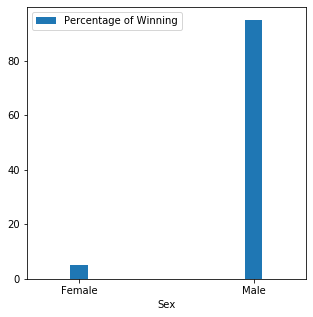

In [60]:
#create a dataframe for gender and count of each gender
gender_df= df.groupby('Sex', as_index=False)['Sex'].agg({'Gender Count':'count'})
x= gender_df[gender_df["Sex"]=="Male"] #dataset containig the male count
y=  gender_df[gender_df["Sex"]=="Female"]#dataset containing the female count
sum_gender = (x["Gender Count"]).sum() + (y["Gender Count"]).sum() #dataset containing the number of females and males
male_perc = ((x["Gender Count"]).sum()/sum_gender)*100 #percentage of male winners
female_perc = ((y["Gender Count"]).sum()/sum_gender)*100 #percentage of female winners
percentage = [female_perc,male_perc] 

gender_df['Percentage of Winning'] = percentage 
gender_df
#plot percetage of female winners and male winners

gender_df.plot.bar(rot=0, figsize=(5,5), width=0.1, x= "Sex", y="Percentage of Winning")

<h1>Count most frequent words </h1>
<body>Now that the data is clean, one of the goals is to find the most repeated word in the <i>Motivation</i>, to find out the most topic female winners were involved in, in the category they win in the most. (Waiting for Basma)</body>

In [61]:
#create a dataset where the category is chemistry
cdf2= df[df["Category"]=="Chemistry"]
#find the most common 50 word
Counter(" ".join(cdf2["Motivation"]).split()).most_common(50)

[('of', 277),
 ('the', 217),
 ('for', 203),
 ('his', 94),
 ('and', 93),
 ('in', 78),
 ('their', 63),
 ('development', 47),
 ('on', 38),
 ('chemical', 34),
 ('discovery', 32),
 ('to', 27),
 ('work', 26),
 ('studies', 25),
 ('chemistry', 24),
 ('synthesis', 23),
 ('contributions', 23),
 ('structure', 19),
 ('recognition', 18),
 ('organic', 18),
 ('by', 17),
 ('concerning', 17),
 ('investigations', 13),
 ('methods', 13),
 ('into', 11),
 ('high', 11),
 ('discoveries', 11),
 ('reactions', 11),
 ('determination', 10),
 ('especially', 10),
 ('a', 10),
 ('services', 9),
 ('method', 9),
 ('elements', 8),
 ('invention', 8),
 ('use', 8),
 ('theory', 7),
 ('fundamental', 7),
 ('molecules', 7),
 ('research', 7),
 ('molecular', 7),
 ('particularly', 7),
 ('structures', 7),
 ('mechanistic', 7),
 ('has', 6),
 ('compounds', 6),
 ('substances', 6),
 ('reaction', 6),
 ('field', 6),
 ('systems', 6)]

However, there are still some stop words that we would like to elimnate. Therefore, NLTK will be used along with regex expressions to remove stop words.

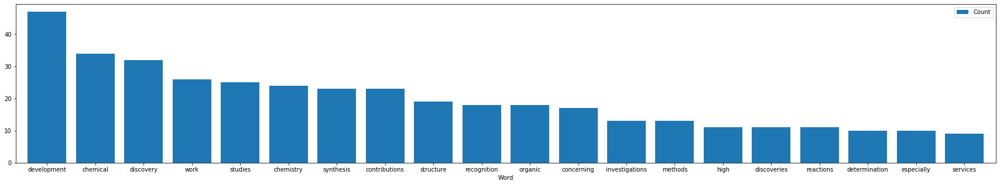

In [62]:
#Create a dataframe for chemistry category (Basma)
cdf2= df[df["Category"]=="Chemistry"]
#using NLTK to remove English stop words
stopwords = nltk.corpus.stopwords.words('english')
# RegEx for stopwords
REGEX_stopwords = r'\b(?:{})\b'.format('|'.join(stopwords))
# replace '|'-->' ' and drop all stopwords
words = (cdf2.Motivation
           .str.lower()
           .replace([r'\|', REGEX_stopwords], [' ', ''], regex=True)
           .str.cat(sep=' ')
           .split()
)

# generate a DF to hold the count for each word
rslt = pd.DataFrame(Counter(words).most_common(20),
                    columns=['Word', 'Count']).set_index('Word')
rslt.plot.bar(rot=0, figsize=(30,5), width=0.8) #create a bar chart with the most repeated words

WE CAN CHECK THE MOST REPEATED WORD FOR THE MOST INTERESTING CATEGORY IN FEMALES (MARWA)

Motivation missing 21 values (MARWA)

<h1> Observing coorelation between <i>Sex</i> and <i>Organization Country</i> </h1>
    <body>A check, below, is made to observe the coorelation between the organization country and the sex. </body>

In [63]:
contengency_table = pd.crosstab(df["Organization Country"],df["Sex"], margins= True)
contengency_table

Sex,Female,Male,All
Organization Country,,,
"Alsace (then Germany, now France)",0,1,1
Argentina,0,2,2
Australia,0,6,6
Austria,0,6,6
Belgium,0,6,6
Canada,0,7,7
China,1,1,2
Czechoslovakia,0,1,1
Denmark,0,9,9


In [64]:
st.chi2_contingency(contengency_table)

(43.11942770884672,
 0.9275813364191259,
 58,
 array([[2.64993026e-02, 9.73500697e-01, 1.00000000e+00],
        [5.29986053e-02, 1.94700139e+00, 2.00000000e+00],
        [1.58995816e-01, 5.84100418e+00, 6.00000000e+00],
        [1.58995816e-01, 5.84100418e+00, 6.00000000e+00],
        [1.58995816e-01, 5.84100418e+00, 6.00000000e+00],
        [1.85495119e-01, 6.81450488e+00, 7.00000000e+00],
        [5.29986053e-02, 1.94700139e+00, 2.00000000e+00],
        [2.64993026e-02, 9.73500697e-01, 1.00000000e+00],
        [2.38493724e-01, 8.76150628e+00, 9.00000000e+00],
        [6.88981869e-01, 2.53110181e+01, 2.60000000e+01],
        [2.64993026e-02, 9.73500697e-01, 1.00000000e+00],
        [1.05997211e+00, 3.89400279e+01, 4.00000000e+01],
        [1.35146444e+00, 4.96485356e+01, 5.10000000e+01],
        [2.64993026e-02, 9.73500697e-01, 1.00000000e+00],
        [2.64993026e-02, 9.73500697e-01, 1.00000000e+00],
        [2.64993026e-02, 9.73500697e-01, 1.00000000e+00],
        [1.32496513e-01, 4

Since the <i>p</i> value is much greater than 0.05, then no coorelation is observed. Therefore, we will try to observe the country which has the most female Nobel Prize winners

In [65]:
df_female_institutes = df [df["Sex"]=="Female"]

In [66]:
female_country = df_female_institutes["Organization Country"].mode()
print(female_country)

0    United States of America
dtype: object


Seems like the USA has the most female Nobel prize winners. Let's see how did that change over the years.

In [67]:
df_female_institutes_USA = df_female_institutes[df_female_institutes["Organization Country"] == "United States of America"]

In [68]:
df_female_institutes_USA
CountStatus= df_female_institutes_USA["Year"].value_counts()
CountStatus

2009    4
1983    1
1947    1
2004    1
1977    1
1963    1
1988    1
Name: Year, dtype: int64

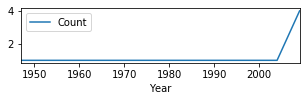

In [69]:
df_female_institutes_USA_copy = df_female_institutes_USA.copy() #copy the dataframe which contains the female winners from the USA
col1 = df_female_institutes_USA_copy['Year'] #NAME THE FIRST COLUMN YEAR
df_female_institutes_USA_copy = df_female_institutes_USA_copy.groupby('Year').size() #get the count of females per year in the USA
df_female_institutes_USA_copy = pd.DataFrame(df_female_institutes_USA_copy)
newcolname2 = {'Count'} #name the second column count
df_female_institutes_USA_copy.columns = newcolname2 #add the second column to the dataframe
df_female_institutes_USA_copy.plot(linestyle='-',figsize=(5,1)) #plot the data frame using a line graph

The graph demonstrates that there is a sharp increase in the count of female winners at around 2004 inside the United States of America.

<h1>What are the chances of you winning a Nobel Prize?</h1>
<span> We first observe the unique values of <i> Birth Country</i>, then we see how many times each country had someone winning a nobel prize.  Finally, we calculate the percentage of every existing country winning a nobel prize. To elboarte, it is the percentage of the winners of a certain country with respect to the total number of winners. Accordingly, your chance to win a nobel prize will based on the winning percentage of that country.</span>

In [70]:
#get unique values and name their column as Birth Country
threecopy = df.copy()
threecopy = threecopy['Birth Country'].unique() # getting unique values of Birth Country
threecopy = pd.DataFrame(threecopy)
newcolname = {'Birth Country'} #The name of the new column in the dataset threecopy
threecopy.columns = newcolname

#get the count of each of the Birth Country and name their column as count
fourcopy = df.copy()
col1 = fourcopy['Birth Country'].unique()
fourcopy = fourcopy.groupby('Birth Country').size() # their count for each 
fourcopy = pd.DataFrame(fourcopy)
newcolname2 = {'count'}
fourcopy.columns = newcolname2


#merging unique birth country with their count:

onemerge = pd.merge(threecopy, fourcopy, on='Birth Country', how='outer')
onemerge.head(3)

#get percent of each country to see the chances of winning a nobel prize according to the country
col3 = onemerge['count']
numberoftotal = col3.sum()
fivecopy = onemerge.copy()
fivecopy = fivecopy.assign(chancesTowin = (col3 / numberoftotal) * 100)
fivecopy.head(3)
# see if the sum of values in percent chancesTowin equals to 100%
fivecopy['chancesTowin'].sum()
fivecopy.head(10)


#Check the percentage for a certain country winning the nobel prize
Questionnine = fivecopy[(fivecopy['Birth Country'] == "Netherlands")]
Questionnine
print(Questionnine['chancesTowin'])

0    2.021277
Name: chancesTowin, dtype: float64


<h1>Lets Graph the percentage for each of the Birth Country </h1> <span> We are graphing the percentage to make it easier to visualize the chances of winning for each Country. In the begining there was one graph which had all the countries labeled in the X-axis beside each other but that made it hard to differentiate between each countries' to win, so we divided the graph into several graphs for the ease of the eyes.As you can see in the Y-axis the highest number was thirty, which means that the highest percentage we got was 30 % compared to other countries </span>

<Figure size 60000x60000 with 0 Axes>

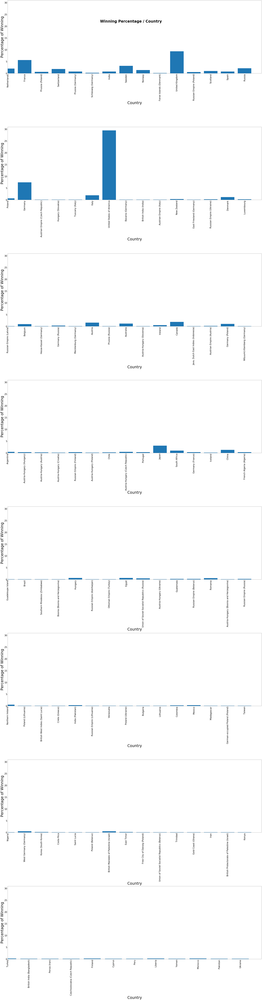

In [75]:
graphdataframe = fivecopy.copy()



rcParams.update({'figure.autolayout': True})
plt.figure(figsize=(100,100), dpi=600)

reso_names = graphdataframe['Birth Country']
reso_values = graphdataframe['chancesTowin']

N=15
sublists_names = [reso_names[x:x+N] for x in range(0, len(reso_names), N)]
sublists_values = [reso_values[x:x+N] for x in range(0, len(reso_values), N)]

size = int(len(reso_values))
fig, axs = plt.subplots(nrows=size//N+1, sharey=True, figsize=(50,190), dpi=50)

fig.suptitle('Winning Percentage / Country', 
          **{ 'size': 50, 'weight': 'bold'})

for ax, names, values in zip(axs, sublists_names, sublists_values):
    ax.bar(range(len(values)), values, align='center')
    ax.set_xlabel('Country', fontsize=50)
    ax.set_ylabel('Percentage of Winning', fontsize=50)
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation='vertical')
    ax.set_xlim(0, len(names))
    ax.tick_params(axis='both', which='major', labelsize=30)
    #ax.set_xlim(0, N)

fig.subplots_adjust(bottom=0.05, top=0.95)
plt.show()
